# Analiza danych biologicznych bydła mlecznego
---
## WSTĘP - Teoria

### 1. Zbiór

- Zbiór zawiera dane zgenotypowanych krów pochodzących z krajów członkowskich Unii Europejskiej, uczestniczących w ocenie genomowej bydła mlecznego.

- Dane pochodzą z sekwencjonowania na mikromacierzach, gdzie oznaczane są SNPy (pojedyncze zmiany w nukleotydach)



>Polimorfizm pojedynczego nukleotydu (ang. Single Nucleotide Polymorphism w skrócie SNP) – zjawisko zmienności sekwencji DNA, która polega na zmianie pojedynczego nukleotydu (A, T, C lub G) pomiędzy osobnikami danego gatunku lub drugim, odpowiadającym chromosomem danego osobnika.
>Przykładowo w dwóch sekwencjach DNA od różnych osobników, AAGCCTA i AAGCTTA, występuje różnica w jednym nukleotydzie. W tym wypadku mówimy o 2 allelach: C i T.


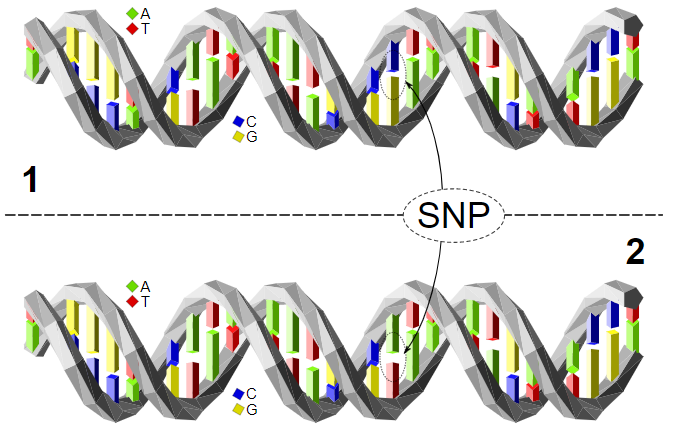


^[https://pl.wikipedia.org/wiki/Polimorfizm_pojedynczego_nukleotydu]

---

### 2. Mikromacierze

- Występuje wiele rodzajów mikromacierzy. Są one przygotowane pod sekwencjonowanie i wyłapywanie konkretnych SNPów - np. SNP genu MC1R współodpowiedzialny za kolor umaszczenia bydła


- Dane sekwencjonowania reprezentowane są przez standard Illuminy, opisujący Allele w jeden z dwóch sposobów:

1) A/C/T/G - każdy allel jest kodowany literą odpowiedniego nukleotydu, który został w nim odczytany

2) A/B - każdy allel jest spłaszczony do grupy alleli homozygotycznych lub heterozygotycznych, tworząc tym samym pary: homozygotyczne dominujące i recesywne, heterozygotyczne. Możliwe kodowania kolejno: AA, BB, AB




---

## DANE - Posiadane zestawy

### 1. Własciwości zestawu wejściowego

* Dane tekstowe tabelaryczne


* Posiadają kolumny zawierające między innymi: SNP ID, numer osobnika, Allel1 i Allel2 w formacie A/C/T/G oraz informacja czy osobnik ma czerwone umaszczenie (kolumna colour)


* Liczba osobników na plik wynosi ~ 40 000


* Interpretacja końcowa SNPu zależy od oznaczeń łącznie w kolumnach Allele1 i Allele2 -> na podstawie połączenia kolumn można intepretować czy dany gen powoduje u osobnika chorobę lub nosicielstwo. 

---

## 2. Wymagania do analizy

* Analiza cech genetycznych opiera się na oznaczeniach A/B. Należy więc przetłumaczyć allele.


* SNPy z niskim call_rate <b>(<0.55)</b> powinny zostać wykluczone z analizy (wymagania obniżone na potrzeby analizy - normalnie nie bierze się pod uwagę call_rate poniżej 95%)

    
* Nie wszystkie SNPy używane są do oceny cech genetycznych. Analiza ma dotyczyć kilku cech, jednak w pliku wynikowy powinny znaleźć się wszystkie SNPy spełniające powyższe wymagania.

    
* Nazwy zwierząt mają zdefiniowany format o następującym wzorze: <br>
<b>[2 znakowy kod ISO państwa][12 liczb numeru miedzynarodowego]</b> <br>np: PL001234567890.

---

## 3. Cel analizy

- oszacować czy kilkukrotnie sprawdzanie tych samych odcinków sekwencji, pozwala na zmniejszenie liczby ponownie analizowanych pełnych próbek.

- przygotowanie pliku do załadowania do bazy



<br><br><br><br>

Wybrano zakres kolorów RdYIBu do kolorowania wykresów.

---

# DANE

## 1. Przedstawienie danych

In [596]:
#należy zacząć od załadowania wszystkich potrzebnych bibliotek

import pandas as pd
import numpy as np
import matplotlib as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff


In [597]:
filenames = ['p1.txt', 'p2.txt', 'p3.txt', 'p4.txt']
with open('p1e3.txt', 'w') as outfile:
    for fname in filenames:
        with open(fname) as infile:
            for line in infile:
                outfile.write(line)

In [598]:
dane_wejsciowe = pd.read_csv('p1e.txt', sep = ',', low_memory=False)

* Poniżej wyświetlono 5 pierwszych wierszy z danych wejściowych.

In [599]:
display(dane_wejsciowe.head())

,SNP Name,Sample ID,Allele1 - TOP,Allele2 - TOP,GC Score,Sample Name,Sample Group,Sample Index,SNP Index,SNP Aux,...,R,X,Y,X Raw,Y Raw,B Allele Freq,Log R Ratio,CNV Value,CNV Confidence,colour
0,ABCA12,FRAM0014525831,-,-,0.205217,-,-,-,-,-,...,-,-,-,-,-,-,-,-,-,0
1,ACA_EDA_2,FRAM0014525831,-,-,0.991722,-,-,-,-,-,...,-,-,-,-,-,-,-,-,-,0
2,ACA_SDE2,FRAM0014525831,-,-,0.689031,-,-,-,-,-,...,-,-,-,-,-,-,-,-,-,0
3,ARS-BFGL-BAC-10172,FRAM0014525831,G,G,0.160525,-,-,-,-,-,...,-,-,-,-,-,-,-,-,-,0
4,ARS-BFGL-BAC-1020,FRAM0014525831,G,G,0.238163,-,-,-,-,-,...,-,-,-,-,-,-,-,-,-,0


- Obserwacje:

1) zbiór zawiera dużo nieprzydatnych i nieuzupełnionych kolumn. Wynika to z ustawień sekwecjonatora illumuna

2) kolumna SampleID posiada niepoprawne nazwy osobników, niezgodne ze wzorem.

3) allele kodowane są w formacie illumina A/C/T/G, powinny być w formacie A/B

4) nie ma potrzeby przechowywania ani analizy osobników o niskim call_rate, lub brakujących oznaczeniach w choć jednym z alleli (uniemożliwia to interpretacje wyniku)


---

### Wstępne przedstawienie niewyczyszczonych danych

* podział na płeć

Niezgodne (niemiędzynarodowe) nazewnictwo ma swoje plusy. Zawiera ono literę z oznaczoną płcią (czwarte miejsce w nazwie). Sprawdzimy jak aktualnie wygląda proporcja płci.

Dane wyświetlam na interaktywnym wykresie:

In [600]:
df_vis = dane_wejsciowe.copy()
df_vis['sex'] = df_vis['Sample ID'].str[3]


fig = px.histogram(df_vis, x=df_vis.drop_duplicates(subset = ['Sample ID'])['sex'], color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

* powyżej widać, że w zbiorze mamy 5 byków i 2 krowy. 

* zobaczmy jak dane wyglądają jeśli sprawdzimy ile SNPów przypada na płeć

In [601]:
fig = px.histogram(df_vis, x="sex", color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

In [602]:
def draw_table(df):

    snp_num_m = df['sex'].value_counts()[0]
    snp_num_f = df['sex'].value_counts()[1]
    sex_count_m = df.drop_duplicates(subset = ['Sample ID'])['sex'].value_counts()[0]
    sex_count_f = df.drop_duplicates(subset = ['Sample ID'])['sex'].value_counts()[1]
    avg_snp_per_sample_m = df['sex'].value_counts()[0]/df.drop_duplicates(subset = ['Sample ID'])['sex'].value_counts()[0]
    avg_snp_per_sample_f = df['sex'].value_counts()[0]/df.drop_duplicates(subset = ['Sample ID'])['sex'].value_counts()[1]

    data_table = [['lp','male', 'female'],
                 ['liczba SNPów',snp_num_m, snp_num_f ],
                 ['liczba osobnikow',sex_count_m , sex_count_f],
                 ['średnia na osobnika',avg_snp_per_sample_m ,avg_snp_per_sample_f]]
    
    
    return data_table


In [603]:
table = draw_table(df_vis)
tab = ff.create_table(table)
tab.show()


* Na podstawie powyższej tabeli wnioskować można na jakim typie mikromacierzy została przebadana dana grupa zwierząt. Dzięki temu można sprawdzić w dokumentacji czy konkretnych SNPów można spodziewać się w danej grupie.

## 2. Czyszczenie danych

* napiszę kilka funkcji rozwiązujące zauważone powyżej problemy

In [604]:
# funkcja do usuwania niepotrzebnych kolumn
def drop_cols(df):
    
    #unikamy popularnego błędu spowodowanego pracą na "widoku" tabeli (copy warning)
    df = df.copy()
    try:
        df = df[['SNP Name','Sample ID','Allele1 - TOP','Allele2 - TOP','GC Score', 'colour']]
    except:
        print("Error with drop_cols(), perhaps problem with conames")
    
    return df


#usuwamy brakujące dane w kolumnie snps
def delete_missing_SNPs(df):
    
    df = df.copy()
    try:
        df = df.loc[(df['Allele1 - TOP'] != '0') & (df['Allele1 - TOP'] != '0')]
        df = df.loc[(df['Allele2 - TOP'] != '-') & (df['Allele2 - TOP'] != '-')]
        if len(df['Allele1 - TOP'].unique() == 4) & len(df['Allele2 - TOP'].unique() == 4):
            return df
    except:
        print("Something is wrong with delete missing SNPs function")
        
#zmiana kodowania illuminy na AB
def change_illumina_coding(df):
    
    #słownik uporządkowujący Allele
    clear_dict = {}
    clear_dict['C|A'] = 'A|C'
    clear_dict['G|A'] = 'A|G'
    clear_dict['T|A'] = 'A|T'
    clear_dict['G|C'] = 'C|G'
    
    #słownik główny do zmiany formatu
    map_dict = {}
    map_dict['A|C'] = 'A|B'
    map_dict['A|G'] = 'A|B'
    map_dict['A|T'] = 'A|B'
    map_dict['C|G'] = 'A|B'
    map_dict['A|A'] = 'A|A'
    map_dict['C|C'] = 'B|B'
    map_dict['G|G'] = 'B|B'
    map_dict['T|T'] = 'B|B'
    
    df['combined'] =  df['Allele1 - TOP'] + "|" + df['Allele2 - TOP']
    df['cleared'] = df['combined'].apply(lambda y:clear_dict[y] if y in clear_dict.keys() else y)

    df['Allele1 - TOP'] = df['cleared'].apply(lambda y: y.split('|')[0])
    df['Allele2 - TOP'] = df['cleared'].apply(lambda y: y.split('|')[1])
    
    
     # Tworzenie nowej kolumny z wyczyszczonymi wartościami w parach i zamienianie ich słownikiem na AB
    df['new_values'] = df['cleared'].apply(lambda x:map_dict[x] if x in map_dict.keys() else x)

    df['Allele1 - TOP'] = df['new_values'].apply(lambda x: x.split('|')[0])
    df['Allele2 - TOP'] = df['new_values'].apply(lambda x: x.split('|')[1])

    
    df = df.drop(columns=['combined', 'cleared', 'new_values'])
    
    return df
   
#dodamy kolumne z wiekiem, jednocześnie dopasowując nazwy ustalonego formatu
def add_col_with_sex(df):
    
    df['sex'] = df['Sample ID'].str[3]
    #change name
    df['Sample ID']=(df['Sample ID'].replace({'840F':'US','FRAM':'FR','DNKM':'DK','FINM':'FI','SWEM':'SE', }, regex=True))
    df['num']= df['Sample ID'].str[2:]
    df['num'] = df['num'].str.zfill(12)
    df['Sample ID'] = df['Sample ID'].str[0:2] + df['num']
    
    df = df.drop(columns = ['num'])
    
    return df

def delete_low_call_rate(df):
    
    #potrzebujemy tylko osobników z call rate powyżej 0.55
    df = df[df['GC Score'] >= 0.55]
    
    return df

In [605]:
df_vis_next = drop_cols(df_vis)
df_vis_next = delete_missing_SNPs(df_vis_next)
df_vis_next = change_illumina_coding(df_vis_next)
df_vis_next = add_col_with_sex(df_vis_next)
df_vis_next = delete_low_call_rate(df_vis_next)

---

## Przegląd danych po czyszczeniu

## Liczba pozostałych SNPów ze względu na płeć

In [606]:
snps_by_sex = [len(df_vis_next[df_vis_next['sex'] == 'M']), len(df_vis_next[df_vis_next['sex'] == 'F'])]
y_bar = ['male', 'female']

fig = go.Figure(go.Bar(
            x=snps_by_sex,
            y=y_bar,
            orientation='h'))

fig.show()

---
* PRZED CZYSZCZENIEM

In [607]:

table = draw_table(df_vis)
tab = ff.create_table(table)
tab.show()



---
* PO CZYSZCZENIU

In [608]:
print("PO CZYSZCZENIU")
table = draw_table(df_vis_next)
tab = ff.create_table(table)
tab.show()

PO CZYSZCZENIU


In [609]:
df_vis_next.describe()

,GC Score,colour
count,394892.000000,394892.000000
mean,0.774969,0.647673
std,0.129829,0.477696
min,0.550003,0.000000
25%,0.662447,0.000000
50%,0.774842,1.000000
75%,0.887452,1.000000
max,1.000000,1.000000


* Jak więc powyżej widać, czyszczenie znacznie zredukowało liczbę SNPów.

### Co to oznacza?

1) próbki nie były właściwie przechowywane, stąd niski call rate analizy

2) próbki były sekwencjonowane na innych macierzach -  w przypadku gdy dany SNP nie występuje u żadnego osobnika można wnioskować, że próbka nie była testowana na dedykowanej macierzy

3) niepoprawna kalibracja sekwencjonatora lub nieprawidłowo użyte odczynniki.



---
<b> Statystyka dla SNPów poprawnie/niepoprawnie odczytanych

In [610]:
all_snp_bc = len(df_vis)
all_snp_ac = len(df_vis_next)
data = [all_snp_bc, all_snp_ac]

plot_names = ['before_clean', 'after_clean']
fig = px.pie(values=data, names=plot_names, color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

* Jak widać powyżej -  aż 69% odczytanych SNPów nie zostało przeczytanych poprawnie. Oznacza to, że wystąpił chociaż jeden z powyżej opisanych problemów. Niemniej 31% genów dalej nadaje się do analizy

* można też sprawdzić podstawowe statystyki dla kolumny GC Score

In [611]:
avg = df_vis_next['GC Score'].mean()
std = np.std(df_vis_next['GC Score'])
median = df_vis_next['GC Score'].median()

tableGS = [['avg', 'std', 'median'], [avg, std, median]]


In [612]:
tab = ff.create_table(tableGS)
tab.show()

* Jak widać powyżej, dane po wyczyszczeniu są dość stabilne, jednak mają stosunkowo niski ogólny poziom call rate -> standardowo około 0.9

<b>Oznacza to, że sam sekwencjonator był skonfigurowany poprawnie i problem wystąpił prawodpodobnie z samą jakością próbki.</b>

# Analiza cechy chorobowej DUMPS
---

### 1. DUMPS

* UMPS jest letalną chorobą genetyczną, która występuje u bydła. Bardzo ważną rolą analiz jest wychwytywanie zwierząt z tym rodzajem defektu i wykluczanie ich z rynku wymian.


>DUMPS jest warunkowany przez haplotyp HHD. Jest to letalna recesywna mutacja genu syntetazy urydynomonofosforanowej. Gen odpowiedzialny za tą mutację jest też nazywany „genem wczesnej zamieralności zarodków” gdyż homozygotyczne zarodki zamierają około 40 dnia ciąży w okresie ich implantowania się w macicy. Skutkiem tego krowa po opuszczeniu jednej rui wchodzi w kolejny cykl rujowy, co wydłuża jej okres międzywycieleniowy i ma istotny wpływ na rachunek ekonomiczny. DUMPS jest jedną z wcześniej wykrytych wad – w USA już w 1988 roku wprowadzono oficjalnie testowanie bydła w celu wykrycia nosicieli DUMPS. Za jednego z głównych nosicieli mutacji DUMPS uznaje się buhaja Skokie Sensation Ned, urodzonego w 1957 roku, z którego linii pochodzi większość znanych rozpłodników przekazujących tę wadę. W ostatnich latach największym światowym nosicielem mutacji DUMPS był amerykański buhaj Happy Herd Beautician i to za jego pośrednictwem nastąpiło rozpowszechnienie się tej anomalii na świecie. Nosicielstwo oznaczane jest w katalogach buhajów symbolem DP, a buhaje wolne od nosicielstwa oznacza się skrótem DP-.




^[https://www.kisamen.pl/articles/page/Choroby-genetyczne-bydla]

* W naszych danych gen ten jest warunkowany przez SNP o nazwie UMPS, sprawdźmy więc jak nasze małe stadko wypada pod kątem tej mutacji

In [613]:
umps_snps = df_vis_next[df_vis_next['SNP Name'].str.contains('UMPS')]

In [614]:
umps_snps

,SNP Name,Sample ID,Allele1 - TOP,Allele2 - TOP,GC Score,colour,sex
89190,UMPS,US000031433839,A,B,0.659436,0,F
529383,UMPS,DK000000002615,B,B,0.687084,1,M
617238,UMPS,DK000000002615,A,B,0.604260,1,M
661213,UMPS,DK000000002615,B,B,0.916995,1,M
702428,UMPS,FI000000000991,B,B,0.903778,1,M
790977,UMPS,FI000000000995,B,B,0.705192,0,M
834922,UMPS,SE000000000451,B,B,0.587335,0,M


In [615]:
gkk = umps_snps.groupby(['Sample ID', 'GC Score']) 

In [616]:
#pogrupujmy nasze dane
gkk.first()


SNP Name Allele1 - TOP Allele2 - TOP  colour sex
Sample ID      GC Score                                                 
DK000000002615 0.604260     UMPS             A             B       1   M
               0.687084     UMPS             B             B       1   M
               0.916995     UMPS             B             B       1   M
FI000000000991 0.903778     UMPS             B             B       1   M
FI000000000995 0.705192     UMPS             B             B       0   M
SE000000000451 0.587335     UMPS             B             B       0   M
US000031433839 0.659436     UMPS             A             B       0   F

* wykres dla wizualizacji GC Score w tabeli UMPS

In [617]:
fig = px.scatter(umps_snps, y="GC Score", x = 'Sample ID', color_discrete_sequence=px.colors.sequential.RdBu)
fig.show()

 Jak widać powyżej dwa osobniki mają heterozygotyczne oznaczenie w SNPie odpowiedzialnym za DUMPS
 
 * US000031433839 - osobnik ten nie jest chory, jest nosicielem choroby, jednak zwiększa on prawdopodobieństwo wystąpienia choroby u potomstwa. Należy go więc wykluczyć z giełdy materiału genetycznego.
 
 * DK000000002615 ma aż trzy oznaczenia UMPSa. Oznacza to, że sekwencjonator trafił 3 razy na sekwencje odpowiadającą temu SNPowi. Zwróćmy jednak uwagę na GC Sorce reprezentujący Call Rate. Odczyt sugerujący nosicielstwo wadliwego genu ma znacznie niższy call rate niż odczyt potwierdzający zdrowie osobnika. Jest to już przesłanka by powtórzyć badanie, a wstępnie uznać osobnika za zdrowego. Jednak w tym przypadku mamy jeszcze jeden odczyt sugerujący zdrowego osobnika. Wg procedury w takiej sytuacji: <b>zwierze należy uznać za zdrowe i nia ma powodu do ponawiania danych</b>.

In [618]:
df_vis_next

,SNP Name,Sample ID,Allele1 - TOP,Allele2 - TOP,GC Score,colour,sex
5,ARS-BFGL-BAC-10245,FR000014525831,B,B,0.750395,0,M
6,ARS-BFGL-BAC-10345,FR000014525831,A,B,0.849042,0,M
9,ARS-BFGL-BAC-10867,FR000014525831,B,B,0.794944,0,M
11,ARS-BFGL-BAC-10952,FR000014525831,A,A,0.873741,0,M
13,ARS-BFGL-BAC-10972,FR000014525831,B,B,0.779259,0,M
...,...,...,...,...,...,...,...
878909,UA-IFASA-9717,SE000000000451,A,A,0.977838,0,M
878912,UA-IFASA-9734,SE000000000451,B,B,0.974258,0,M
878914,UA-IFASA-9744,SE000000000451,A,A,0.797120,0,M
878916,UA-IFASA-9812,SE000000000451,B,B,0.973240,0,M


###  przygotowanie DF bez zwierząt wykluczonych z powodu DUMPS

In [619]:
excluded_animals = ['US000031433839']

In [620]:
df_vis_next = df_vis_next[df_vis_next['Sample ID'] != 'US000031433839']
df_vis_next = df_vis_next[['Sample ID', 'SNP Name', 'Allele1 - TOP', 'Allele2 - TOP']]

In [621]:
df_vis_next.to_csv('Final.csv', index = False, header = None)

---
# WNIOSKI

Mimo iż dane były przygotowane niepoprawnie - wykryto błędy na etapie sekwencjonowania próbki -, udało się je wyczyścić, przeanalizować i wykluczyć osobniki zagrażające zdrowiu populacji z rynku materiału biologicznego. Stosunkowo duża ilość brakujących danych nie przeszkodziła w sprawdzeniu i analizie SNPów chorobowych odpowiedzialnych za BLAD. Oznacza to, że przyjęta metodologia, przyjmująca redundancyjne działanie sekwencjonatora - sekwencjonowanie kilkakrotnie tych samych fragmentów - mimo, że relatywnie droższa, umożliwiła analizę materiału bez jeszcze droższego ponawiania sekwencjonowania u częsci zwierząt. 